<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Привет, Ольга Меня зовут Катя и я проведу ревью твоей работы Это не учебный проект поэтому светофора из комментариев не будет Только в случае критической ошибки я попрошу тебя отправить работу второй раз после корректировки замечания </div>

<div class="alert alert-block alert-success"> <b>General Feedback</b> <a 
class="tocSkip"></a>
Великолепнейший проект проведенный в соответствие с потребностями заказчика RFM анализ - огонь Все расчеты корректны Единственное что можно удучшить - несколько оптимизировать код Но это из разряда украшательств Главное что у тебя получилась полезная для заказчика работа Большое спасибо за участие в Мастерской, с наступающими праздниками и успехов во всем</div>

# Аналитика данных благотворительного фонда “АиФ. Доброе сердце”

**Заказчик**

Фонд «АиФ. Доброе сердце» был создан в 2005-м году по инициативе еженедельной газеты «Аргументы и факты». За эти годы больше 10 тысяч подопечных со сложными диагнозами получили помощь с оплатой операций, лекарств и медоборудования.

## Описание проекта

Благотворительный фонд "АиФ. Доброе сердце" хочет лучше узнать своих благотворителей, чтобы максимально эффективно выстроить работу с ними. 

По итогам проекта представители фонда хотели бы получить следующие результаты:
- Сегменты пользователей: RFM-анализ, описание сегментов, таблицу с id благотворителя и его сегментом;

Прочие метрики, которые можно получить из данных.

Для анализа представлены следующие данные:
- данные о действиях пользователей (3 файла);
- данные о платежах пользователей (1 файл).

## Задачи проекта

- анализ эффективности каналов привлечения пользователей,
- проведение RFM-анализа, 
- расчет основных маркетинговых и продуктовых (DAU, WAU, MAU, sticky factor) метрик.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Великолепное введение Стоит уточнить какие именно метрики рассчитаны в проекте </div>

## Загрузка и предобработка данных

In [1]:
#импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import os
import datetime
import warnings
from tqdm import tqdm
import statistics


%matplotlib inline

pd.set_option('display.float_format', lambda x: f'{x:.2f}')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# задаем стиль для графиков plotly
pio.templates.default = 'simple_white'

# отключение сообщений об ошибках
warnings.filterwarnings('ignore')


<div class="alert alert-block alert-success"> OK! <b>Reviewer's comment</b> <a 
class="tocSkip"></a>Просто на будущее - установка стилей, отключение ворнингов можно делать в той же ячейке что и импорт библиотек </div>

### Данные по платежам

In [2]:
#загрузка данных по платежам
df = pd.read_csv('datasets/paymentsaif.csv', sep = ';', encoding = 'cp1251', usecols = [0, 2, 3, 5, 9, 17, 20, 21, 30])

In [3]:
df.head(3)

,OrderIdsMindboxId,OrderFirstActionDateTimeUtc,OrderFirstActionChannelIdsMindboxId,OrderFirstActionChannelName,OrderTotalPrice,OrderLineProductName,OrderLinePriceOfLine,OrderLineStatusIdsExternalId,OrderCustomerIdsMindboxId
0,37117,14.10.2021 15:50,1,Административный сайт Mindbox,1,На уставную деятельность,1,Paid,2734
1,58434,18.03.2021 10:52,1,Административный сайт Mindbox,50,На уставную деятельность,50,Paid,2734
2,102699,23.11.2022 8:42,9,Сайт,100,Пожертвование Благотворительный фонд «АиФ. Доб...,100,notpaid,2734


In [4]:
# Переименование столбцов датафрейма
df.columns = ['paid_id', 'datetime_fa', 'channel_fa_id', 'name_channel_fa', 'total_price', 'product_name', 'price_line', 'status_id', 'user_id']

Для дальнейшего анализа мы будем использовать следующие данные (из таблицы по платежам):
- paid_id - идентификатор платежа
- datetime_fa - дата и время первого действия
- channel_fa_id - идентификатор канала привлечения первого действия
- name_channel_fa - название канала привлечения первого действия
- total_price - итоговая стоимость заказа
- product_name - название продукта (на кого или на что делается перевод)
- price_line - цена линии 
- status_id - идентификатор статуса заказа 
- user_id - идентификатор пользователя mindbox (для связи таблиц) 

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Здорово что даешь осмысленные имена колонкам</div>

In [5]:
df.head(3)

,paid_id,datetime_fa,channel_fa_id,name_channel_fa,total_price,product_name,price_line,status_id,user_id
0,37117,14.10.2021 15:50,1,Административный сайт Mindbox,1,На уставную деятельность,1,Paid,2734
1,58434,18.03.2021 10:52,1,Административный сайт Mindbox,50,На уставную деятельность,50,Paid,2734
2,102699,23.11.2022 8:42,9,Сайт,100,Пожертвование Благотворительный фонд «АиФ. Доб...,100,notpaid,2734


**Проверка данных на наличие пропусков**

In [6]:
#Проверка данных на количество пропусков
df.isna().sum()

paid_id              0
datetime_fa          0
channel_fa_id        0
name_channel_fa      0
total_price          0
product_name       200
price_line           0
status_id            0
user_id              0
dtype: int64

In [7]:
#Общее количество записей в таблице платежей
df.shape[0]

54445

In [8]:
#Процент пропусков названий целей платежей
print('{} % '. format(round(df['product_name'].isna().sum() / len(df)*100, 2)))

0.37 % 


Всего 0,37% пропусков в столбце с данными о том, на что делается пожертвование. Вероятно, пользователи не выбирали цель пожертвования, а просто переводили деньги в фонд

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Или не переводили деньги в фонд Здесь интересно является ли это полу обязательным к заполнению при отправке денег Или произошел какой либо технический сбой при отправке формы</div>

In [9]:
# Пропуски в столбце product_name значением 'Не заполнено'
df['product_name'] = df['product_name'] .fillna('Не заполнено')

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
В принципе можно было и удалить такие строки - 0,37% не повлияют на общий результат
</div>

**Проверка на наличие дубликатов**

In [10]:
df.duplicated().sum()

0

**Сокращение длинных записей**

In [11]:
df['product_name'].unique()

array(['На уставную деятельность',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Игнатий Овчинников',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Ратмир Шаповалов',
       'Не заполнено',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Эвелина Квасова',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Максим Широкин',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Дарья Макеева',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Иван Нагорный',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Кира Чубарова',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Руслан Сафронов',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Кристина Шабетник',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Никита Суриков',
       'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Снежана О.',
       'Пожертвование Бла

Очень длинные названия неудобно использовать при построении графиков. Введем замену значений, которая не приведет к искажению смысла. Запись вида 'Пожертвование Благотворительный фонд «АиФ. Доброе сердце» Алексей Зайцев' заменим на 'Пожертвование - Алексей Зайцев' 

In [12]:
df['product_name'] = df['product_name'].apply(lambda x: x.replace(' Благотворительный фонд «АиФ. Доброе сердце» ', ' - '))

In [13]:
df['product_name'] = df['product_name'].apply(lambda x: x.replace('Пожертвование - Пожертвование на уставную деятельность БФ «АиФ. Доброе сердце»', 'На уставную деятельность'))

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Здесь чтобы записать код в одну строку можно использовать if/else конструкцию прямо в lambda функции </div>

In [14]:
df.head()

,paid_id,datetime_fa,channel_fa_id,name_channel_fa,total_price,product_name,price_line,status_id,user_id
0,37117,14.10.2021 15:50,1,Административный сайт Mindbox,1,На уставную деятельность,1,Paid,2734
1,58434,18.03.2021 10:52,1,Административный сайт Mindbox,50,На уставную деятельность,50,Paid,2734
2,102699,23.11.2022 8:42,9,Сайт,100,Пожертвование - Игнатий Овчинников,100,notpaid,2734
3,111808,29.03.2023 15:15,9,Сайт,300,Пожертвование - Ратмир Шаповалов,300,Paid,2847
4,67535,16.06.2021 23:10,1,Административный сайт Mindbox,200,На уставную деятельность,200,Paid,2847


In [15]:
# Возможные статусы заказа
df['status_id'].unique()

array(['Paid', 'notpaid', 'fail'], dtype=object)

In [16]:
# Каналы привлечения первого действия
df['name_channel_fa'].unique()

array(['Административный сайт Mindbox', 'Сайт'], dtype=object)

In [17]:
df.dtypes

paid_id             int64
datetime_fa        object
channel_fa_id       int64
name_channel_fa    object
total_price         int64
product_name       object
price_line          int64
status_id          object
user_id             int64
dtype: object

Столбец datetime_fa имеет строковый тип данных. Необходимо его преобразовать в дату

In [18]:
# создадим одно поле только с датой, а второе с датой и временем

df['datetime_fa_dt'] = pd.to_datetime(df['datetime_fa'])

In [19]:
df['datetime_fa'] = pd.to_datetime(df['datetime_fa']) . dt.normalize ()

In [20]:
df.head(1)

,paid_id,datetime_fa,channel_fa_id,name_channel_fa,total_price,product_name,price_line,status_id,user_id,datetime_fa_dt
0,37117,2021-10-14,1,Административный сайт Mindbox,1,На уставную деятельность,1,Paid,2734,2021-10-14 15:50:00


In [21]:
df['datetime_fa_dt'].min()

Timestamp('2021-01-01 00:00:00')

In [22]:
df['datetime_fa_dt'].max()

Timestamp('2023-12-10 23:36:00')

Мы имеем данные по платежам за период с 1 января 2021 года до 10 декабря 2023 года.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Оличное преобразование данных Можно посмотреть параметр parse_dates для метода read_csv Он также упрозщает преобразование дат  </div>

### Данные о действиях пользователей

In [23]:
# Назначение нового текущего каталога 
os.chdir('datasets/')

In [24]:
os.getcwd()

'D:\\jupyter\\datasets'

In [25]:
# Список файлов

list_files = ['dobroaif_1.csv', 'dobroaif_2.csv', 'dobroaif_3.csv']

In [26]:
# Подготовка списка для датасетов

list_dfs = []

# Подготовка списка с названием колонок датасета

new_cols = ['action_id', 'action_name', 'datetime', 'channel_id', 'channel_name', 'user_id']

In [27]:
# Загрузка датасетов

for file in list_files:
    data = pd.read_csv(file, encoding='utf8', sep=';', usecols=[0, 2, 4, 6, 7, 17])
    old_cols = data.columns.tolist()
    cols_dict = {k: v for k, v in zip(old_cols, new_cols)}
    data = data.rename(columns=cols_dict)
    list_dfs.append(data)

In [28]:
# Соединение датасетов в один

df_actions = pd.concat(list_dfs)

In [29]:
df_actions.head(10)

,action_id,action_name,datetime,channel_id,channel_name,user_id
0,2734,Импорт при переносе исторической базы клиентов,2022-03-19 21:30:59,9,Сайт,2734
1,80475,Оплата заказа,2022-04-18 15:48:35,1,Административный сайт Mindbox,2734
2,101792,Оплата заказа,2022-04-18 15:49:50,1,Административный сайт Mindbox,2734
3,632765,Изменение часового пояса клиентов при изменени...,2022-11-23 08:40:16,9,Сайт,2734
4,632766,Переход на сайт,2022-11-23 08:40:16,1729,utm_term Не указан,2734
5,632767,Показ попапа Подписка на вебпуши,2022-11-23 08:41:07,9,Сайт,2734
6,632768,Оформление заказа в операции Заказ - Создание ...,2022-11-23 08:42:29,9,Сайт,2734
7,632769,"Изменился клиент, пользующийся устройством",2022-11-23 08:42:29,9,Сайт,2734
8,632770,Регистрация клиента в операции 'Заказ - Создан...,2022-11-23 08:42:29,9,Сайт,2734
9,632771,Объединение клиентов,2022-11-23 08:42:29,9,Сайт,2734


<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Очень крутой способ чтения и конкатенирования файлов Супер </div>

**Проверка на наличие пропусков**

In [30]:
#Проверка данных на количество пропусков
df_actions.isna().sum()

action_id       0
action_name     0
datetime        0
channel_id      0
channel_name    0
user_id         0
dtype: int64

В данных нет пропусков.

**Проверка на наличие дубликатов**

In [31]:
df_actions.duplicated().sum()

0

Дубликаты отсутствуют.

**Проверка типов данных**

In [32]:
# Проверка данных на соответствие типов

df_actions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2109586 entries, 0 to 115607
Data columns (total 6 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   action_id     int64 
 1   action_name   object
 2   datetime      object
 3   channel_id    int64 
 4   channel_name  object
 5   user_id       int64 
dtypes: int64(3), object(3)
memory usage: 112.7+ MB


Столбец datetime имеет строковый тип данных. Необходимо его преобразовать в дату. Создадим один вариант с датой без времени, а второй с учетом времени для удобства использования в дальнейших расчетах.

In [33]:
df_actions['datetime'] = pd.to_datetime(df_actions['datetime'])
df_actions['date'] = pd.to_datetime(df_actions['datetime']) . dt.normalize ()

In [34]:
df_actions.dtypes

action_id                int64
action_name             object
datetime        datetime64[ns]
channel_id               int64
channel_name            object
user_id                  int64
date            datetime64[ns]
dtype: object

In [35]:
df_actions['action_name'].unique()

array(['Импорт при переносе исторической базы клиентов', 'Оплата заказа',
       'Изменение часового пояса клиентов при изменении региона', ...,
       'Копия Спасибо за ежемесячные пожертвование (повторные) Запрос отписки',
       'Новости Байсаева Запрос отписки',
       'Новости Байсаева Не доставлено'], dtype=object)

In [36]:
df_actions_import = df_actions.query('action_name == "Импорт при переносе исторической базы клиентов"')

In [37]:
df_actions_import['date'].min()

Timestamp('2022-03-19 00:00:00')

In [38]:
max = df_actions_import['date'].max()
max

Timestamp('2022-06-30 00:00:00')

Импорт клиентов из исторической базы производился с 19.03.2022 по 30.06.2022. Данные по активности пользователей за этот период рассматривать некорректно, поэтому мы их отсечем и будем рассматривать даты, которые начинаются с 31 июня 2022 года. 

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Отличная идея </div>

In [39]:
df_actions = df_actions.query('date > @max')

В данном разделе мы загрузили данные и выполнили необходимую предбработку: ознакомились с данными, проверили на наличие дубликатов, обработали пропуски, преобразовали названия столбцов в наиболее удобные для чтения, привели ряд значений к более короткой форме записи, выполнили преобразование типа данных с столбцах с датами. Таким образом, данные были подготовлены для дальнейшего анализа.

## Исследовательский анализ данных

### Основные статистические характеристики по платежам

In [40]:
df[['price_line', 'total_price']].describe()

,price_line,total_price
count,54445.00,54445.00
mean,1079.33,1013.30
std,10976.44,10965.62
min,0.00,0.00
25%,150.00,100.00
50%,300.00,300.00
75%,500.00,500.00
max,1100000.00,1100000.00


Мы посмотрели характеристики по датасету с платежами. 
Максимальное значение пожертвования составило 1 100 000 руб. Минимальное - 0. Нужно будет проверить по нулевым значениям, а также понять, какие действительно платежи прошли, т.к. полученные характеристики относятся ко всем имеющимся данным по платежам.
Общее количество записей - 54445
Среднее значение платежа - 1079,33 руб.
Медианное значение - 300 руб.

Теперь посмотрим те же характеристики по платежам со статусом "Paid"

In [41]:
df_paid = df.query('status_id == "Paid"')

In [42]:
df_paid[['price_line', 'total_price']].describe()

,price_line,total_price
count,41079.00,41079.00
mean,760.95,752.55
std,2722.20,2715.98
min,0.00,0.00
25%,150.00,108.00
50%,300.00,300.00
75%,500.00,500.00
max,200000.00,200000.00


Максимальный платеж составляет 200 тыс.руб. Медианное значение по проведенным платежам - 300 руб. Среднее значение пожертвования определилось равным 760,95 руб. Минимальное по прежнему 0.

In [43]:
# Посмотрим записи, в которых платеж = 0
df_paid.query('price_line == 0').head(10)

,paid_id,datetime_fa,channel_fa_id,name_channel_fa,total_price,product_name,price_line,status_id,user_id,datetime_fa_dt
30136,93973,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29350,2022-01-07 00:34:00
30152,93988,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29365,2022-01-07 10:50:00
30159,93995,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29372,2022-01-07 13:44:00
30160,93997,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29374,2022-01-07 14:51:00
30161,93999,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29376,2022-01-07 15:07:00
30162,94000,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29377,2022-01-07 15:37:00
30166,94004,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29381,2022-01-07 17:56:00
30176,94009,2022-01-07,9,Сайт,0,Не заполнено,0,Paid,29386,2022-01-07 19:06:00
30184,94014,2022-02-07,9,Сайт,0,Не заполнено,0,Paid,29391,2022-02-07 02:52:00
30188,94019,2022-02-07,9,Сайт,0,Не заполнено,0,Paid,29396,2022-02-07 07:38:00


In [44]:
# Посчитаем количество записей, в которых платеж = 0
df_paid.query('price_line == 0')['paid_id'].nunique()

69

Есть некоторое несоответствие в данных. Мы смотрим только данные со статусом "Paid", но среди них присутствуют платежи, равные 0, при этом product_name = NaN, т.е. цель пожертвования не определена. Видимо, такие записи появились в результате технических ошибок, которые не зафиксировались (иначе был бы статус "faid"). Их общее количество составляет 69 строк, что является несущественным по отношению к общему объему данных, **но все же стоит обратить внимание заказчика на наличие таких строк, чтобы разобраться в причине их появления.**

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Ты абсолютно права А чтобы заказчику было проще разобраться стоит посмотреть в какие даты у нас был этот сбой, есть ли там какая то закономерность</div>

Исключим значения, которые имеют статус Paid и при этом значение платежа - 0.

In [45]:
df_paid = df_paid.query('price_line > 0')

### Построение диаграммы размаха по платежам

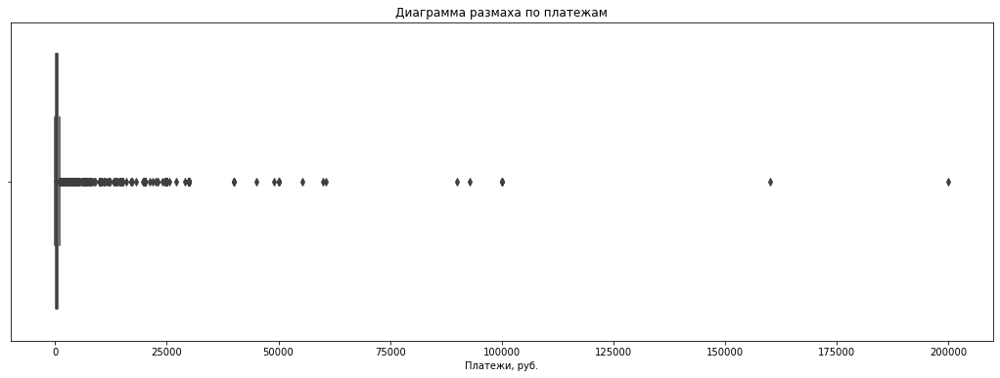

In [46]:
# Построение графика боксплот для сумм платежей
plt.figure(figsize=(18,6))
sns.boxplot(x="price_line", data=df_paid) 
plt.title("Диаграмма размаха по платежам")
plt.xlabel('Платежи, руб.')
plt.show()

Получился не очень наглядный график. Видно, что есть выбросы, доходящие до 200000 руб. Чтобы лучше разглядеть «ящик с усами», изменим масштаб графика.

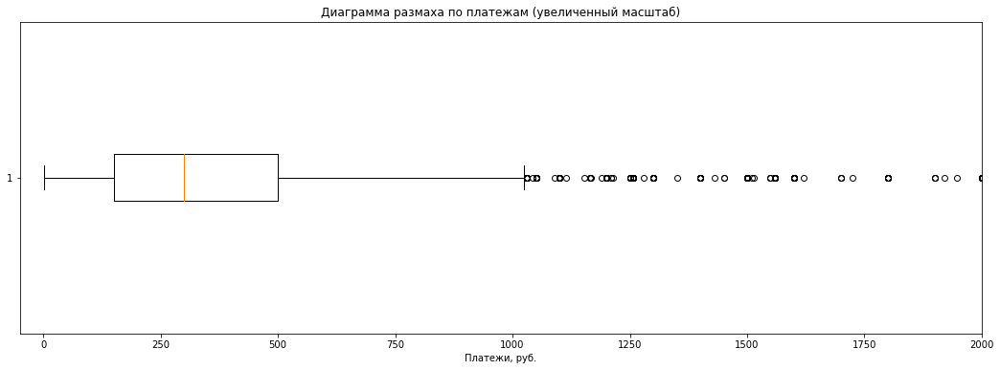

In [47]:
plt.figure(figsize=(18,6))
plt.boxplot(x='price_line', data=df_paid, vert=False) 
plt.xlim(-50, 2000)
plt.title("Диаграмма размаха по платежам (увеличенный масштаб)")
plt.xlabel('Платежи, руб.')
plt.show()

По графику все значения, начиная примерно от 1000 и выше, определяются, как выбросы. В нашем случае мы с такими выбросами ничего не делаем, т.к. каждый платеж важен, и все они состоялись, т.е. являются реальнами данными, а не ошибками.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Очень правильный вывод </div>

### Распределение пожертвований на различные цели (ТОП-10)

In [48]:
#Выделяем два столбца: с суммой пожертвования и целью пожертвования

df_pr_price = df_paid[['total_price', 'product_name']]

In [49]:
# Считаем сумму по каждому пожертвованию

df_pr_price_1 = (
    df_pr_price.groupby('product_name')
    .agg({'total_price':  'sum'}).reset_index()
)

In [50]:
df_pr_price_1.rename(columns = {'total_price':'price_line_sum'}, inplace = True )

In [51]:
# Сортируем по сумме в порядке убывания

df_pr_price_1 = df_pr_price_1.sort_values(['price_line_sum'], ascending=False)

In [52]:
# Получаем ТОП-10 целей пожертвования (по сумме переводов)
df_price_top = df_pr_price_1.head(10)
df_price_top

,product_name,price_line_sum
0,На уставную деятельность,10152296
106,Пожертвование - Пожертвование (хочу помочь),2125497
53,Пожертвование - Егор Цуканов,1071458
101,Пожертвование - Никита Яковлев,791423
81,Пожертвование - Максим Широкин,729045
65,Пожертвование - Игнатий Овчинников,654411
33,Пожертвование - Герман Семёнов,617275
124,Пожертвование - Софья Пантурова,588526
43,Пожертвование - Демид Лебедев,549438
75,Пожертвование - Кристина Разживина,527466


<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Попробуй записать код в предыдущих 5 ячейках в одну строку - так будет оптимальнее Использование церочки методов - один из путей оптимизации кода </div>

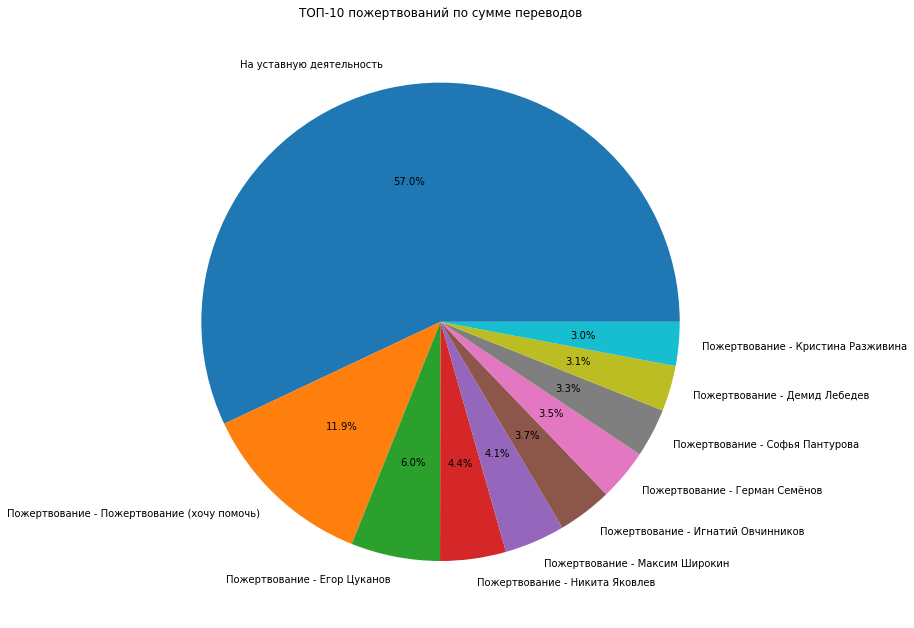

In [53]:
sum_price = df_price_top['price_line_sum']
labels = df_price_top['product_name']
fig1, ax1 = plt.subplots(figsize=(11, 11), subplot_kw=dict(aspect="equal"))

ax1.pie(sum_price, labels=labels, autopct='%1.1f%%')
ax1.set_title('ТОП-10 пожертвований по сумме переводов')
plt.show()

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Как правило на паях мы отражаем не более 4-5 секторов Большее количество частей затрудняет восприятие  </div>

Теперь проверим распределение по наибольшему количеству переводов.

In [54]:
# Считаем сумму по каждому пожертвованию

df_pr_price_2 = (
    df_pr_price.groupby('product_name')
    .agg({'total_price':  'count'}).reset_index()
)

In [55]:
df_pr_price_2.rename(columns = {'total_price':'price_line_count'}, inplace = True )

In [56]:
# Сортируем по количеству в порядке убывания

df_pr_price_2 = df_pr_price_2.sort_values(['price_line_count'], ascending=False)

In [57]:
# Получаем ТОП-10 целей пожертвования (по количеству переводов)
df_count_top = df_pr_price_2.head(10)
df_count_top

,product_name,price_line_count
0,На уставную деятельность,13093
106,Пожертвование - Пожертвование (хочу помочь),3116
53,Пожертвование - Егор Цуканов,1515
81,Пожертвование - Максим Широкин,941
43,Пожертвование - Демид Лебедев,873
124,Пожертвование - Софья Пантурова,806
65,Пожертвование - Игнатий Овчинников,761
34,Пожертвование - Герман и Григорий Алымовы,740
117,Пожертвование - Руслан Сафронов,711
33,Пожертвование - Герман Семёнов,679


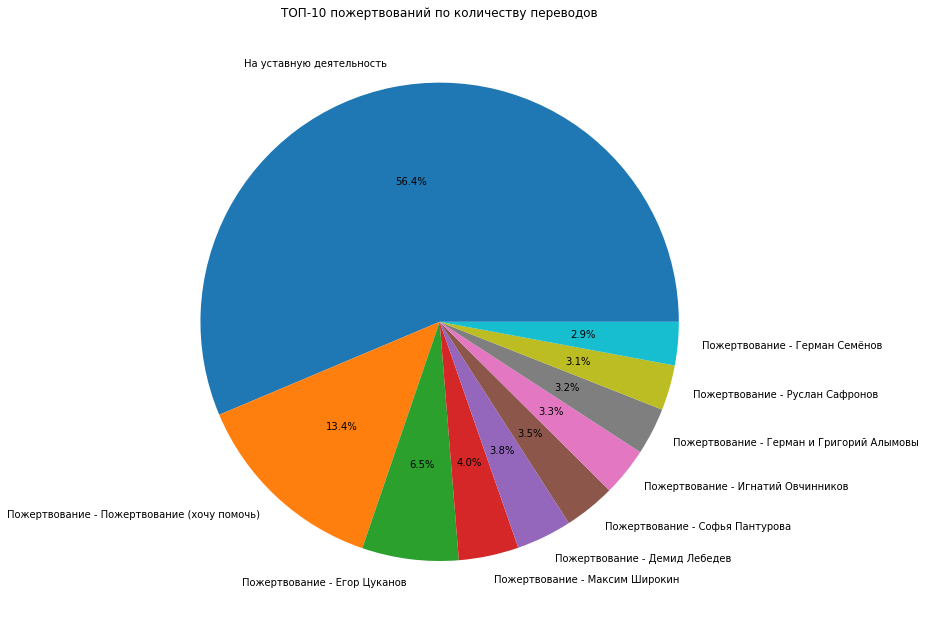

In [58]:
count_price = df_count_top['price_line_count']
labels = df_count_top['product_name']
fig1, ax1 = plt.subplots(figsize=(11, 11), subplot_kw=dict(aspect="equal"))
ax1.pie(count_price, labels=labels, autopct='%1.1f%%')
ax1.set_title('ТОП-10 пожертвований по количеству переводов')
plt.show()

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Обрати внимание  что данный код в принципе аналогичен коду для построения ТОП по сумме переводов Для переиспользования кода попробуй написать функцию, которая одним из агрументов принимает count или sum для агрегации  </div>

### Анализ каналов привлечения

In [59]:
# смотрим общее количество каналов привлечения
df_actions['channel_name'].nunique()

197

Количество каналов привлечения составляет 197. Проверим, какие из них являются наиболее эффективными, т.е. с каких каналов чаще всего переходят на сайт.

In [60]:
df_actions_channels = df_actions[['channel_name', 'user_id']].copy()

In [61]:
# Считаем количество переходов с каждого канала

df_actions_channels = (
    df_actions_channels.groupby('channel_name')
    .agg({'user_id':  'count'}).reset_index()
)

In [62]:
df_actions_channels.rename(columns = {'user_id':'actions_count'}, inplace = True )

In [63]:
# Сортируем по количеству действий в порядке убывания

df_actions_channels = df_actions_channels.sort_values(['actions_count'], ascending=False)

In [64]:
# Получаем ТОП-10 каналов (по количеству действий с них)
df_actions_channels_top = df_actions_channels.head(10)
df_actions_channels_top

,channel_name,actions_count
7,Email,1565598
190,Сайт,323369
188,Административный сайт Mindbox,34094
154,utm_term Не указан,25407
189,Прямой переход,22389
160,vk.com,5489
178,yandex.ru,3251
63,google.com,2225
125,roditeli,1977
8,WebPush,1895


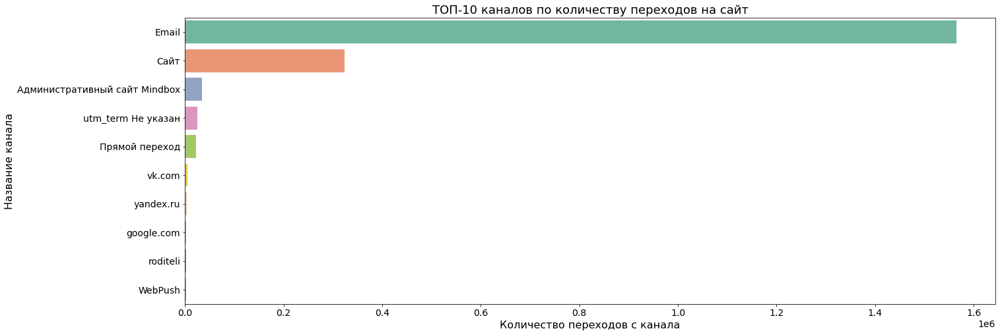

In [65]:
plt.figure(figsize=(22,8))
plt.rcParams.update({'font.size': 14})
ax = sns.barplot(x="actions_count", y="channel_name", data=df_actions_channels_top, ci= None, palette ='Set2');
ax.set_title('ТОП-10 каналов по количеству переходов на сайт', size=18)
ax.set_xlabel("Количество переходов с канала", size=16)
ax.set_ylabel("Название канала", size=16)
plt.show()

Мы определили каналы, с которых чаще всего приходят посетители на сайт. На первом месте, с большим отрывом от остальных, идет канал "Email". С почтовых рассылок на сайт было выполнено более 1,5 млн. переходов. На втором месте находится канал "Сайт", прямые входы на сайт совершили 323369 раз. Также в десятку лидеров по переходам вошли Административный сайт "Mindbox", неизвестные источники (но на них есть utm-метки, можно определить), "Прямой переход" (его, вероятно, можно было бы объединить с каналом "Сайт"), vk.com, yandex.ru, google.com, roditeli и WebPush. 

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
По поводу utm меток Судя по всему переходы на сайт трекаются либо Яндекс Метрикой либо Google Analytics Имена каналов по сути это utm_source. utm_term действительно часто не передается или передается только для маркетинговых кампаний - по сути это ключевое слово  Поэтому интересно возможно ли действительно определить откуда пришел клиент по имеющимся  utm меткам или это просто какой то баг либо незаполненные метки у какой то ссылки на сайт Согласна насчет прямого перехода и Сайт - по сути это direct заход на сайт</div>

### Определение главного (первого) источника входа

Выполняя предобработку данных, мы исключили записи за период времени, в который производился импорт данных при переносе исторической базы. Для тех пользователей, которые уже присутствовали в удаленных записях, первый канал входа может определиться неправильно, поэтому исключим их из этого анализа.

In [66]:
df_actions_import_user = df_actions_import['user_id'].unique()

In [67]:
df_actions_import['user_id'].nunique()

7350

7350 пользователей были добавлены в момент импорта исторической базы.

In [68]:
df_actions['user_id'].nunique()

19186

19186 пользователей добавлены в датасет с активностями.
Для проведения анализа первого входа исключим тех, что добавлены при импорте базы.

In [69]:
df_first_channel = df_actions.copy()
nuser = df_actions_import['user_id']
df_first_channel = df_first_channel.query('user_id not in @nuser')

In [70]:
df_first_channel = df_first_channel[['channel_name', 'user_id', 'datetime', 'date']]

In [71]:
df_first_channel = (
    df_first_channel
    .sort_values('datetime')
    .groupby(['user_id'])
    .agg({'datetime':  'min', 'channel_name':  'first'})
    .reset_index()
)

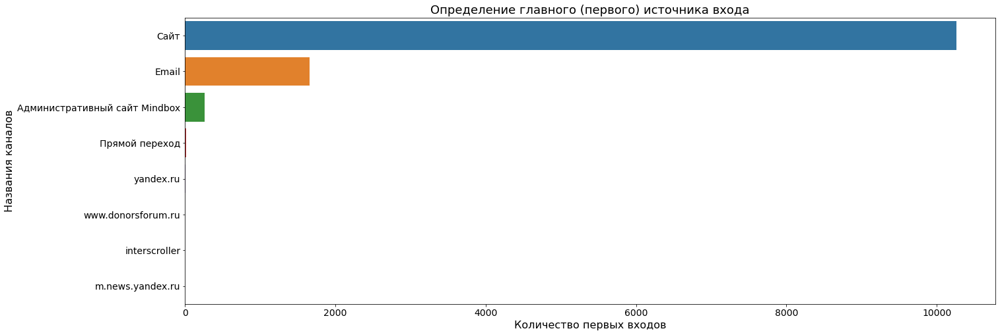

In [72]:
countplt, ax = plt.subplots(figsize = (22, 8))
sns.countplot(y = 'channel_name', data=df_first_channel, order=df_first_channel['channel_name'].value_counts().index, orient='v') 
plt.xlabel('Количество первых входов', size=16)
plt.ylabel('Названия каналов', size=16)
plt.title('Определение главного (первого) источника входа', size=18)
plt.show()

In [73]:
# всего каналов в базе
df_actions['channel_name'].nunique()

197

In [74]:
# количество каналов, с которых был выполнен первый вход
df_first_channel['channel_name'].nunique()

8

In [75]:
df_first_channel['channel_name'].unique()

array(['Административный сайт Mindbox', 'Email', 'Сайт', 'Прямой переход',
       'www.donorsforum.ru', 'interscroller', 'yandex.ru',
       'm.news.yandex.ru'], dtype=object)

In [76]:

df_first_channel = (
    df_first_channel.groupby('channel_name')
    .agg({'user_id':  'count'}).reset_index()
)

In [77]:
df_first_channel.sort_values(by='user_id', ascending=False)

,channel_name,user_id
7,Сайт,10265
0,Email,1657
5,Административный сайт Mindbox,263
6,Прямой переход,12
4,yandex.ru,2
1,interscroller,1
2,m.news.yandex.ru,1
3,www.donorsforum.ru,1


In [78]:
df_actions_import_1 = (
    df_actions_import
    .sort_values('datetime')
    .groupby(['user_id'])
    .agg({'datetime':  'min', 'channel_name':  'first'})
    .reset_index()
)
df_actions_import_1['channel_name'].unique()

array(['Сайт', 'Административный сайт Mindbox'], dtype=object)

Мы определили общее количество каналов, с которых выполнялись переходы на сайт. Оно составило 197 каналов. Из них всего 8 каналов, с которых пользователи зашли на сайт первый раз. Подавляющее большинство пользователей зашло впервые на сайт с канала, определенного в базе "Сайт". На втором месте Email, на третьем "Административный сайт Mindbox". Т.е. в большинстве случаев, пользователи попадают на сайт, делая прямые заходы.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Отличный вывод </div>

### Анализ динамики пожертвований

In [79]:
df_paid['product_name'].unique()

array(['На уставную деятельность', 'Пожертвование - Ратмир Шаповалов',
       'Не заполнено', 'Пожертвование - Эвелина Квасова',
       'Пожертвование - Максим Широкин', 'Пожертвование - Дарья Макеева',
       'Пожертвование - Иван Нагорный', 'Пожертвование - Кира Чубарова',
       'Пожертвование - Руслан Сафронов',
       'Пожертвование - Кристина Шабетник',
       'Пожертвование - Никита Суриков', 'Пожертвование - Снежана О.',
       'Пожертвование - Кристина Разживина',
       'Пожертвование - Савелий Сунгуров',
       'Пожертвование - Пожертвование (хочу помочь)',
       'Пожертвование - Елизавета Сазонова',
       'Пожертвование - Роман Рыбаков', 'Пожертвование - Полина Чинкова',
       'Пожертвование - Марьяна Чешева', 'Пожертвование - Арман Акопян',
       'Пожертвование - Анастасия Радостева',
       'Пожертвование - Игнатий Овчинников',
       'Пожертвование - Герман Семёнов', 'Пожертвование - Дарья Семенова',
       'Пожертвование - Герман и Григорий Алымовы',
       'Пожертв

Платежи делятся по типу на целевые и нецелевые. Целевые относятся к конкретному ребенку, нецелевые - это платежи в фонд, без уточнения, на кого именно делается перевод. Посмотрим, как в динамике по месяцам делались целевые и нецелевые платежи. Для этого объединим все записи с именами детей и назовем "Пожертвование целевое (на ребенка)". К нецелевым можно отнести: "На уставную деятельность", "Хочу помочь", "Пожертвование регулярное", "Держимся вместе". И отдельно рассмотрим динамику целевых платежей "Поможем жителям ДНР и ЛНР" и нецелевых "Пожертвование регулярное"   

In [80]:
df_paid_gr = df_paid.copy()

# добавим поля с годом и месяцем

df_paid_gr['year_month'] = df_paid_gr['datetime_fa'].apply(lambda x: x.strftime('%Y-%m'))

# удалим сразу из новой таблицы записи с незаполненным полем product_name (таких записей немного, см. разбор выше) 

df_paid_gr = df_paid_gr[df_paid_gr.product_name != 'Не заполнено']

# выделяем ДНР и ЛНР
df_paid_gr_dnr = df_paid_gr.copy()
df_paid_gr_dnr = df_paid_gr_dnr[df_paid_gr_dnr.product_name == 'Пожертвование - Поможем жителям ДНР и ЛНР']

# удаляем из общей таблицы ДНР и ЛНР
df_paid_gr = df_paid_gr[df_paid_gr.product_name != 'Пожертвование - Поможем жителям ДНР и ЛНР']

In [81]:
df_paid_gr.head()

,paid_id,datetime_fa,channel_fa_id,name_channel_fa,total_price,product_name,price_line,status_id,user_id,datetime_fa_dt,year_month
0,37117,2021-10-14,1,Административный сайт Mindbox,1,На уставную деятельность,1,Paid,2734,2021-10-14 15:50:00,2021-10
1,58434,2021-03-18,1,Административный сайт Mindbox,50,На уставную деятельность,50,Paid,2734,2021-03-18 10:52:00,2021-03
3,111808,2023-03-29,9,Сайт,300,Пожертвование - Ратмир Шаповалов,300,Paid,2847,2023-03-29 15:15:00,2023-03
4,67535,2021-06-16,1,Административный сайт Mindbox,200,На уставную деятельность,200,Paid,2847,2021-06-16 23:10:00,2021-06
5,72610,2021-09-20,1,Административный сайт Mindbox,25,На уставную деятельность,25,Paid,2861,2021-09-20 14:29:00,2021-09


In [82]:
# для отдельного анализа выделим  в отдельный датасет данные с регулярными пожертвованиями, они будут также входить в нецелевые платежи

df_paid_gr_reg = df_paid_gr.copy()
df_paid_gr_reg = df_paid_gr_reg[df_paid_gr_reg.product_name == 'Пожертвование - Пожертвование регулярное']

In [83]:
# "На уставную деятельность", "Хочу помочь", "Держимся вместе"

df_paid_gr.loc[(df_paid_gr['product_name'] == 'На уставную деятельность') | (df_paid_gr['product_name'] == 'Пожертвование - Пожертвование (хочу помочь)') \
               | (df_paid_gr['product_name'] == 'Пожертвование - Держимся вместе') | (df_paid_gr['product_name'] == 'Пожертвование - Пожертвование') \
               | (df_paid_gr['product_name'] == 'Пожертвование - Пожертвование регулярное'), 'product_name' ] = 'Нецелевой платеж'

In [84]:

# Определяем целевые платежи на детей

df_paid_gr.loc[(df_paid_gr['product_name'] != 'Нецелевой платеж') & (df_paid_gr['product_name'] != 'Пожертвование - Поможем жителям ДНР и ЛНР') \
                & (df_paid_gr['product_name'] != 'Пожертвование - Пожертвование регулярное'), 'product_name'] = 'Целевой платеж (на ребенка)'

In [85]:
df_paid_gr['product_name'].unique()

array(['Нецелевой платеж', 'Целевой платеж (на ребенка)'], dtype=object)

In [86]:
df_paid_gr_ym = df_paid_gr[['year_month', 'product_name', 'total_price']].copy()

In [87]:
#Делаем группировку по каналам и месяцу и считаем траты
df_paid_gr_ym = df_paid_gr_ym.groupby(['product_name', 'year_month']).agg({'total_price': 'sum'}).reset_index()

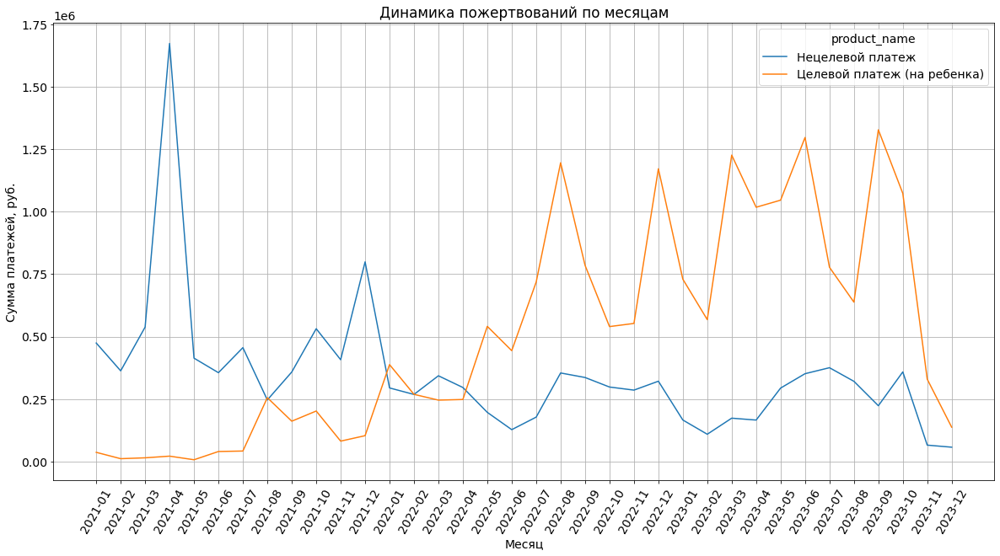

In [88]:
# Строим график динамики платежей по месяцам по типам платежей
plt.figure(figsize=(20, 10))

sns.lineplot(x=df_paid_gr_ym.year_month,
             y=df_paid_gr_ym.total_price,
             hue=df_paid_gr_ym.product_name)
plt.xlabel('Месяц')
plt.ylabel('Сумма платежей, руб.')
plt.title('Динамика пожертвований по месяцам')
plt.grid()
plt.xticks(rotation=60)
plt.show()

In [89]:
# группируем по месяцам таблицу с регулярными платежами
df_paid_gr_reg_ym = df_paid_gr_reg[['year_month', 'total_price']].copy()
df_paid_gr_reg_ym = df_paid_gr_reg_ym.groupby(['year_month']).agg({'total_price': 'sum'}).reset_index()

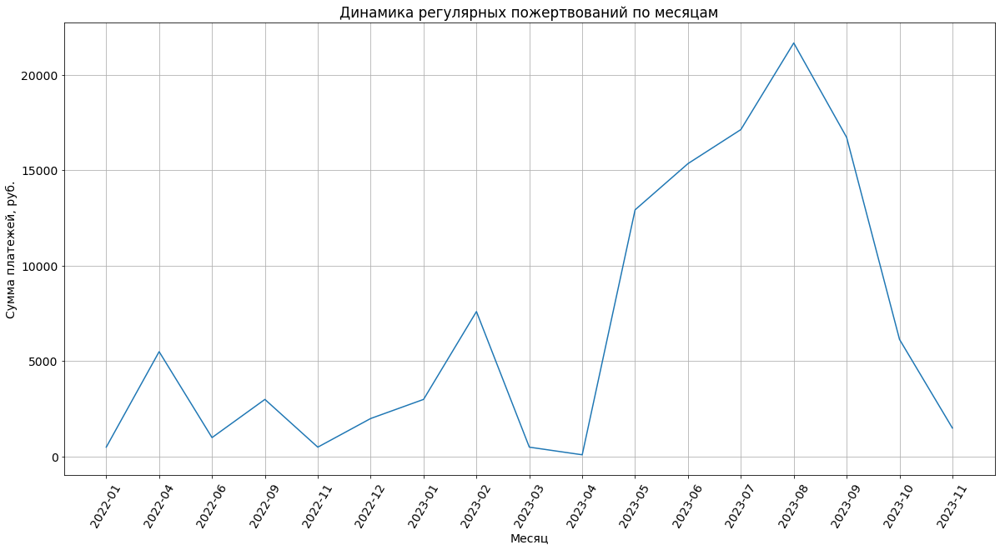

In [90]:
# Строим график динамики регулярных платежей
plt.figure(figsize=(20, 10))
sns.lineplot(x=df_paid_gr_reg_ym.year_month,
             y=df_paid_gr_reg_ym.total_price)
plt.xlabel('Месяц')
plt.ylabel('Сумма платежей, руб.')
plt.title('Динамика регулярных пожертвований по месяцам')
plt.grid()
plt.xticks(rotation=60)
plt.show()

In [91]:
# группируем по месяцам таблицу с платежами для жителей ДНР и ЛНР
df_paid_gr_dnr_ym = df_paid_gr_dnr[['year_month', 'total_price']].copy()
df_paid_gr_dnr_ym = df_paid_gr_dnr_ym.groupby(['year_month']).agg({'total_price': 'sum'}).reset_index()

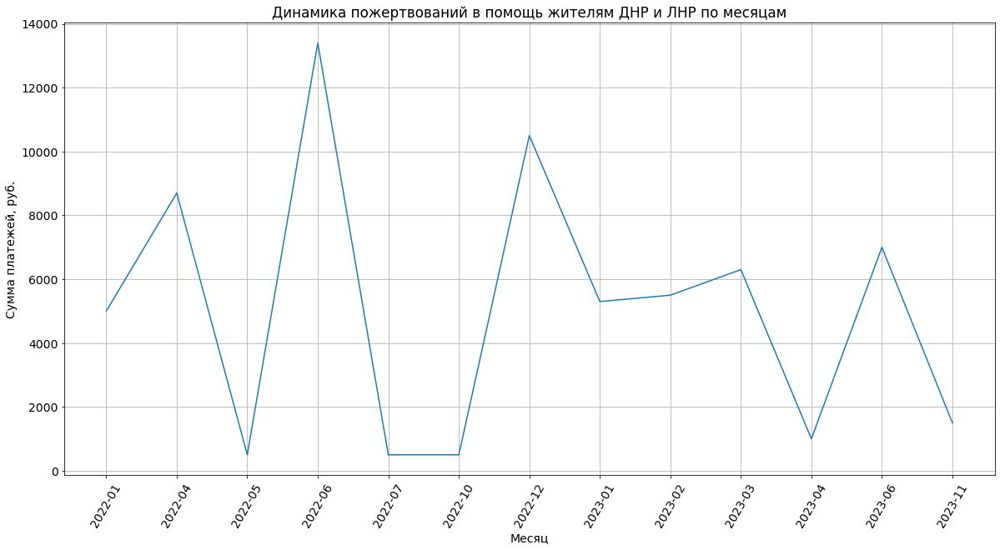

In [92]:
# Строим график динамики платежей для жителей ДНР и ЛНР
plt.figure(figsize=(20, 10))
sns.lineplot(x=df_paid_gr_dnr_ym.year_month,
             y=df_paid_gr_dnr_ym.total_price)
plt.xlabel('Месяц')
plt.ylabel('Сумма платежей, руб.')
plt.title('Динамика пожертвований в помощь жителям ДНР и ЛНР по месяцам')
plt.grid()
plt.xticks(rotation=60)
plt.show()

In [93]:
df_paid_gr_dnr_ym.total_price.max()

13400

In [94]:
df_paid_gr_dnr_ym.total_price.min()

500

Мы посмотрели помесячную динамику платежей за весь доступный для анализа период времени, с 1-го января 2021 года до 10 декабря 2023 года. 
Данные были поделены по типу платежей на целевые и нецелевые. Из целевых были вынесены данные по пожертвованиям в помощь жителям ДНР и ЛНР. 

На графике мы видим: 
- В 2021-м году сумма нецелевых платежей была существенно выше. Минимум по нецелевым платежам в этот период был 250 тыс.руб., максимум - превышал 1,6 млн.руб. в месяц. По целевым платежам: от 0 до 250 тыс.руб. в месяц;
- С января по апрель 2022 года целевые и нецелевые платежи были примерно на одном уровне: 250-350 тыс.руб. 
- А уже с мая 2022 года и до декабря 2023 года - целевые платежи на детей стали существенно превышать нецелевые пожертвования в фонд. В этот период целевые платежи практически не снижались ниже отметки 500 тыс.руб., максимум достигал 1,3 млн.руб. По нецелевым: 100-300 тыс.руб.

Отдельно исследовали динамику регулярных пожертвований. Данные по такому типу платежа начали фиксироваться с января 2022 года. Возможно, в это время был добавлен на сайт фонда новый функционал по оформлению подписки на регулярные пожертвования. На графике  виден видно, что до мая 2023 г. регулярные платежи были невысокие и в сумме колебались от 0 до 7500 руб. в месяц. С мая 2023 г. наблюдается рост суммы регулярных пожертвований. Пик зафиксирован в августе, в этот месяц регуляр. пожертвования превысили 20тыс.руб. Но, несмотря на некоторый рост регулярных пожертвований, их сумма по отношению к сумме нерегулярный платежей - слишком мала.

Также отдельно мы посмотрели, как поступали платежи в поддержку жителей ДНР и ЛНР. Минимальная собранная сумма за месяц составила 500 руб., максимальная - 13400 руб. Максимум был достигнут в июне 2022, минимумы в мае и с июля по октябрь 2022 г. Существенной тенденции к росту по данному виду платежей не видно.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Здесь все великолепно и замечательно Но для того чтобы не создавать очень много датаферймов можно в принципе в исходном создать столбцы с так называемыми флагами - допусти столбец ДНР проставив у каждой записи 0 или 1 Аналогично с регулярными пожертвованиями И для построение графиков просто фильтровать записи исходной таблицы </div>

### Активность по времени суток

In [95]:
df_paid_h = df_paid[['user_id', 'datetime_fa_dt']].copy()

In [96]:
df_paid_h['hours'] = pd.to_datetime(df_paid_h['datetime_fa_dt']). dt.hour

In [97]:
df_paid_h_2 = (
    df_paid_h.groupby('hours')
    .agg({'user_id':  'count'})
    .reset_index()
)

In [98]:
df_paid_h_2 = df_paid_h_2.rename(columns={'user_id': 'count_actions'})

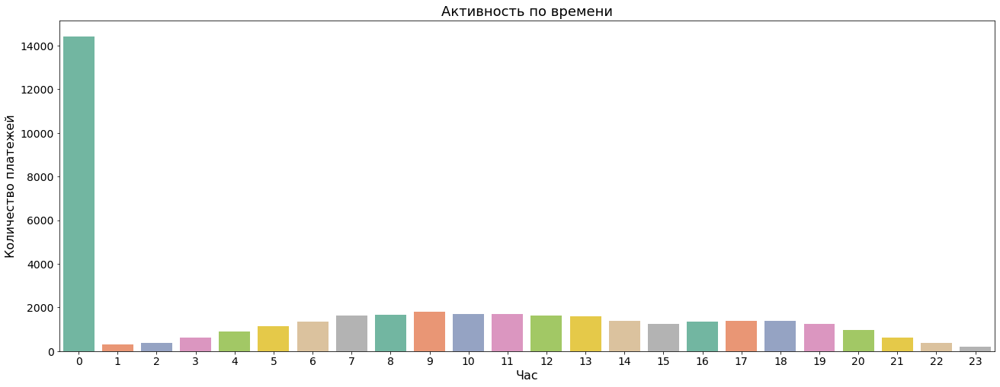

In [99]:
plt.figure(figsize=(22,8))
plt.rcParams.update({'font.size': 14})
ax = sns.barplot(x="hours", y="count_actions", data=df_paid_h_2, ci= None, palette ='Set2');
ax.set_title('Активность по времени', size=18)
ax.set_xlabel("Час", size=16)
ax.set_ylabel("Количество платежей", size=16)
plt.show()

In [100]:
df_paid_h.head()

,user_id,datetime_fa_dt,hours
0,2734,2021-10-14 15:50:00,15
1,2734,2021-03-18 10:52:00,10
3,2847,2023-03-29 15:15:00,15
4,2847,2021-06-16 23:10:00,23
5,2861,2021-09-20 14:29:00,14


In [101]:
df_paid_h_0 = df_paid_h.query('hours == 0')

In [102]:
df_paid_h_0 = (
    df_paid_h_0.groupby('datetime_fa_dt')
    .agg({'user_id':  'count'}).reset_index()
)

df_paid_h_0 = df_paid_h_0.rename(columns={'user_id': 'count'})

df_paid_h_0.sort_values(by=['count'], ascending=False)

,datetime_fa_dt,count
350,2021-12-16 00:00:00,272
412,2022-02-22 00:00:00,158
105,2021-04-16 00:00:00,134
254,2021-09-12 00:00:00,133
389,2022-01-27 00:00:00,133
347,2021-12-13 00:00:00,122
192,2021-07-12 00:00:00,111
299,2021-10-26 00:00:00,107
349,2021-12-15 00:00:00,100
436,2022-04-01 00:00:00,97


In [103]:
df_paid_h_0['datetime_fa_dt'].nunique()

806

На графике распределения платежей по времени виден аномальный всплеск в 0 часов. Была сделана проверка по датам: платежи в полночь проходили 806 дней. Маловероятно, что все пользователи действительно делали переводы в это время, скорее всего это связано с процессингом.

Остальные платежи распрделелись достаточно равномерно по времени: ночью мало, утром увеличивается, днем до опрделенного времени также продолжается увеличение, вечером после 20 часов активность снижается. Чаще всего оплата производится с 7 до 13 часов.  

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a 
class="tocSkip"></a>
Абсолютно с тобой согласна Заметь что наибольшее число получночников наблюдается в 2021 году т в первых месяцах 2022 Возможно если ты оставишь только значения для 2023 года график распределения пожертвований по часам будет более корректным  </div>

### Активность по дням недели

In [104]:
df_paid_dw = df_paid[['user_id', 'datetime_fa']].copy()

In [105]:
df_paid_dw['day_of_week'] = pd.to_datetime(df_paid_dw['datetime_fa']). dt.weekday

In [106]:
df_paid_dw = (
    df_paid_dw.groupby('day_of_week')
    .agg({'user_id':  'count'})
    .reset_index()
)

In [107]:
df_paid_dw = df_paid_dw.rename(columns={'user_id': 'count_actions'})

In [108]:
df_paid_dw['day'] = df_paid_dw['day_of_week'].astype(str)

In [109]:
df_paid_dw = df_paid_dw.replace({'day':{'0':'Понедельник', '1':'Вторник', '2':'Среда', '3':'Четверг', '4':'Пятница', '5':'Суббота', '6':'Воскресенье'}})


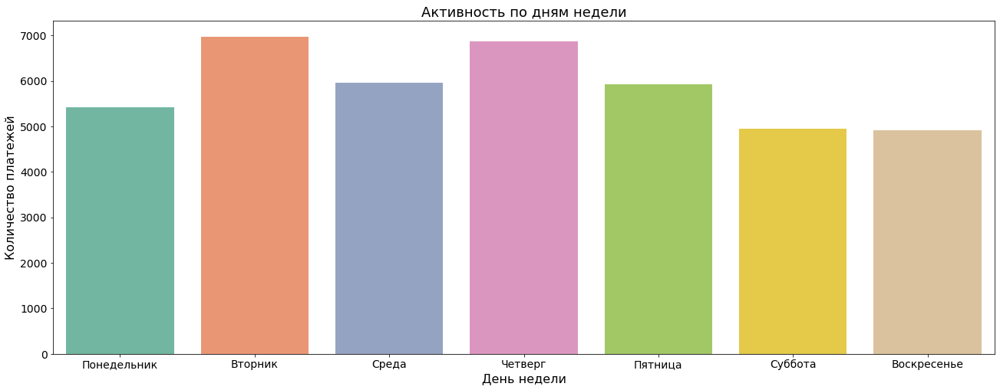

In [110]:
plt.figure(figsize=(22,8))
plt.rcParams.update({'font.size': 14})
ax = sns.barplot(x="day", y="count_actions", data=df_paid_dw , ci= None, palette ='Set2');
ax.set_title('Активность по дням недели', size=18)
ax.set_xlabel("День недели", size=16)
ax.set_ylabel("Количество платежей", size=16)
plt.show()

Чаще всего платежи совершаются по вторникам и четвергам. Реже всего по субботам и воскресеньям. Из будних дней наименьшая активность - понедельник.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b>
    
Супер Поскольку у нас данные за 3 года можно также посмотреть не менялись ли паттерны поведения доноров от года к году</div>

## Продуктовые метрики

### DAU

DAU (Daily Active Users) - ежедневная активность пользователей

In [111]:
# выделяем год, номер месяца и номер недели
df_actions['year'] = df_actions['date'].dt.year
df_actions['month'] = df_actions['date'].dt.month
df_actions['week'] = df_actions['date'].dt.isocalendar().week
df_actions['date'] = df_actions['date'].dt.date


In [112]:
df_actions.head()

,action_id,action_name,datetime,channel_id,channel_name,user_id,date,year,month,week
3,632765,Изменение часового пояса клиентов при изменени...,2022-11-23 08:40:16,9,Сайт,2734,2022-11-23,2022,11,47
4,632766,Переход на сайт,2022-11-23 08:40:16,1729,utm_term Не указан,2734,2022-11-23,2022,11,47
5,632767,Показ попапа Подписка на вебпуши,2022-11-23 08:41:07,9,Сайт,2734,2022-11-23,2022,11,47
6,632768,Оформление заказа в операции Заказ - Создание ...,2022-11-23 08:42:29,9,Сайт,2734,2022-11-23,2022,11,47
7,632769,"Изменился клиент, пользующийся устройством",2022-11-23 08:42:29,9,Сайт,2734,2022-11-23,2022,11,47


In [113]:
df_actions_dau = df_actions[['date', 'user_id']].copy()

In [114]:
df_actions_dau = (
    df_actions_dau.groupby('date')
    .agg({'user_id':  'nunique'}).reset_index()
)

In [115]:
df_actions_dau = df_actions_dau.rename(columns={'user_id': 'DAU'})

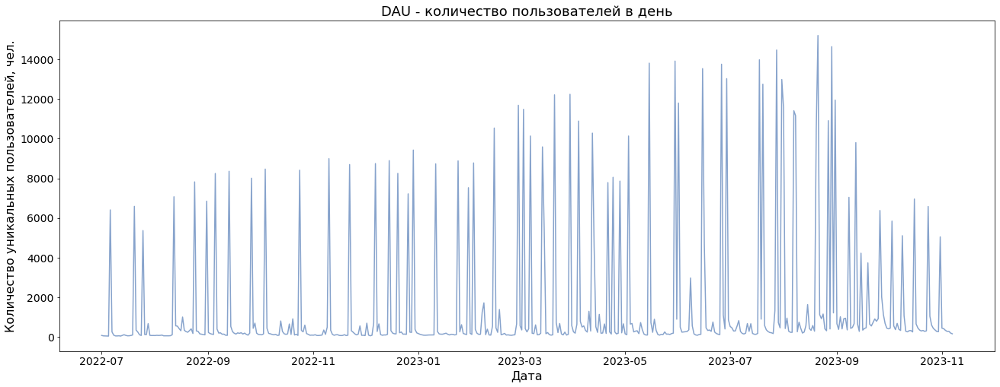

In [116]:
plt.figure(figsize=(22,8))
plt.rcParams.update({'font.size': 14})
plt.plot(df_actions_dau['date'], df_actions_dau['DAU'], color='#87a3cc')
plt.title('DAU - количество пользователей в день', size=18)
plt.xlabel("Дата", size=16)
plt.ylabel("Количество уникальных пользователей, чел.", size=16)
plt.show()

На графике мы видим постепенное увеличение показателя DAU с июля 2022 года сентябрь 2023 года, что говорит о стабильном ежедневном приросте уникальных пользователей. В последние месяцы (октябрь-ноябрь 2023 года) заметен спад активности, показатель ниже предыдущих периодов.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> <a>
    
Отлично</div>

### WAU

WAU (Weekly Active Users) - количество уникальных пользователей в неделю

In [117]:
df_actions_wau = df_actions[['year', 'week', 'user_id']].copy()

In [118]:
df_actions_wau.head()

,year,week,user_id
3,2022,47,2734
4,2022,47,2734
5,2022,47,2734
6,2022,47,2734
7,2022,47,2734


In [119]:
df_actions_wau = (
    df_actions_wau.groupby(['year', 'week'])
    .agg({'user_id':  'nunique'}).reset_index()
)

In [120]:
df_actions_wau = df_actions_wau.rename(columns={'user_id': 'WAU'})

In [121]:
df_actions_wau['date_wau_wy'] = ( df_actions_wau.year.astype(str) + '-' + df_actions_wau.week.astype(str)  )

In [122]:
df_actions_wau = df_actions_wau.sort_values(['year', 'week'], ascending=True)

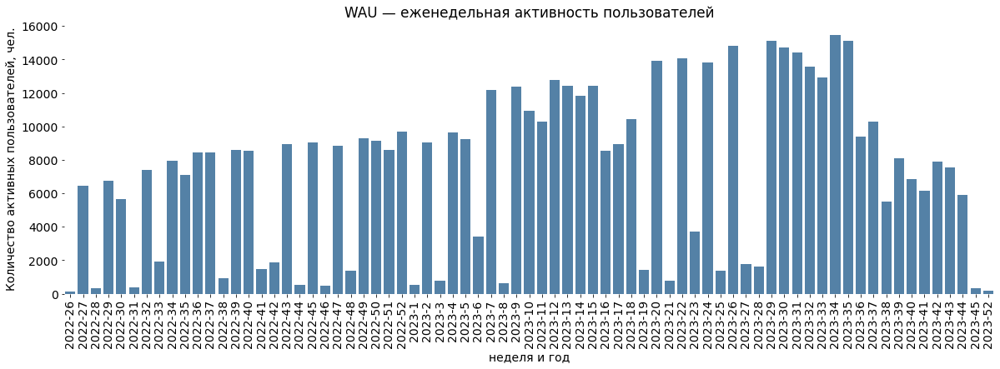

In [123]:
plt.figure(figsize=(20,6))
plt.rcParams.update({'font.size': 14})
ax = sns.barplot (x='date_wau_wy', y='WAU', data = df_actions_wau, color='steelblue')
ax.set_title('WAU — еженедельная активность пользователей')
ax.set_xlabel("неделя и год")
ax.set_ylabel("Количество активных пользователей, чел.")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.show()

На графике мы видим общий рост активности пользователей по неделям. Но в некоторые недели есть просадка, на которую нужно обратить внимание для определения причины.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> 
    
Очень круто Но если речь идет  о динамике и при этому у нас есть большое количество точек лучше предпочесть Lineplot</div>

### MAU

MAU (Monthly Active Users) — ежемесячная активность пользователей.

In [124]:
df_actions_mau = df_actions[['year', 'month', 'user_id']].copy()

In [125]:
df_actions_mau = (
    df_actions_mau.groupby(['year', 'month'])
    .agg({'user_id':  'nunique'}).reset_index()
)

In [126]:
df_actions_mau = df_actions_mau.rename(columns={'user_id': 'MAU'})

In [127]:
df_actions_mau['date_mau_my'] = ( df_actions_mau.year.astype(str) + '-' + df_actions_mau.month.astype(str)  )

In [128]:
df_actions_mau = df_actions_mau.sort_values(['year', 'month'], ascending=True)

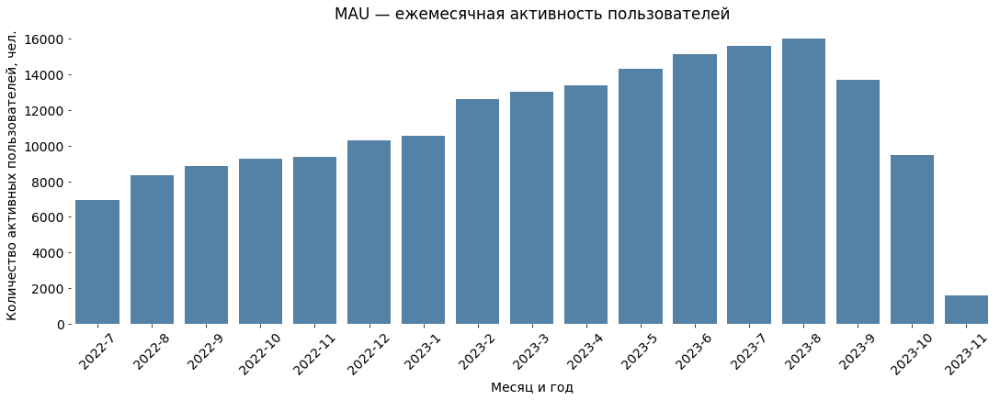

In [129]:
plt.figure(figsize=(18,6))
plt.rcParams.update({'font.size': 14})
ax = sns.barplot (x='date_mau_my', y='MAU', data = df_actions_mau, color='steelblue')
ax.set_title('MAU — ежемесячная активность пользователей')
ax.set_xlabel("Месяц и год")
ax.set_ylabel("Количество активных пользователей, чел.")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.show()

In [130]:
df_actions['date'].max()

datetime.date(2023, 11, 7)

In [131]:
df_actions_mau

,year,month,MAU,date_mau_my
0,2022,7,6964,2022-7
1,2022,8,8339,2022-8
2,2022,9,8856,2022-9
3,2022,10,9272,2022-10
4,2022,11,9347,2022-11
5,2022,12,10274,2022-12
6,2023,1,10559,2023-1
7,2023,2,12591,2023-2
8,2023,3,13019,2023-3
9,2023,4,13368,2023-4


График с метрикой MAU показывает стабильный рост числа пользователей до августа 2023 года, в сентябре и октябре он уже ниже. Так, если максимальный показатель августа составил 16 007 уникальных пользователей в месяц, то в октябре всего 9474 чел., что примерно на 40% меньше. За ноябрь данные собраны не полностью (до 07.11.2023), поэтому его не смотрим.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> 
    
Великолепно</div>

### SF (Sticky Factor)

SF (Sticky Factor) — показатель, который отражает регулярноcть взаимодействия пользователя с продуктом в течение выбранного периода времени. С помощью данной метрики можно оценить лояльность и активность пользователей. 

Измеряется по формуле: (DAU / MAU) * 100 %

In [132]:
df_actions_dau.head(2)

,date,DAU
0,2022-07-01,82
1,2022-07-02,60


In [133]:
df_actions_mau.head(2)

,year,month,MAU,date_mau_my
0,2022,7,6964,2022-7
1,2022,8,8339,2022-8


In [134]:
df_actions_dau['month'] = pd.to_datetime(df_actions_dau['date']).dt.month

In [135]:
df_actions_dau['year'] = pd.to_datetime(df_actions_dau['date']).dt.year

In [136]:
df_new = df_actions_dau.merge(df_actions_mau, on = ['year', 'month'], how='left')

In [137]:
df_sticky = (
    df_new.groupby(['year', 'month', 'MAU'])
    .agg({'DAU': 'mean'}).reset_index()
)

In [138]:
df_sticky['sticky_factor'] = (df_sticky['DAU'] / df_sticky['MAU']) * 100

In [139]:
df_sticky = df_sticky.sort_values(['year', 'month'], ascending=True)

In [140]:
df_sticky.head(10)

,year,month,MAU,DAU,sticky_factor
0,2022,7,6964,704.10,10.11
1,2022,8,8339,915.87,10.98
2,2022,9,8856,1020.07,11.52
3,2022,10,9272,771.65,8.32
4,2022,11,9347,743.07,7.95
5,2022,12,10274,1568.13,15.26
6,2023,1,10559,955.94,9.05
7,2023,2,12591,1430.46,11.36
8,2023,3,13019,2201.06,16.91
9,2023,4,13368,1987.20,14.87


In [141]:
df_sticky['date_my'] = ( df_sticky.year.astype(str) + '-' + df_sticky.month.astype(str)  )

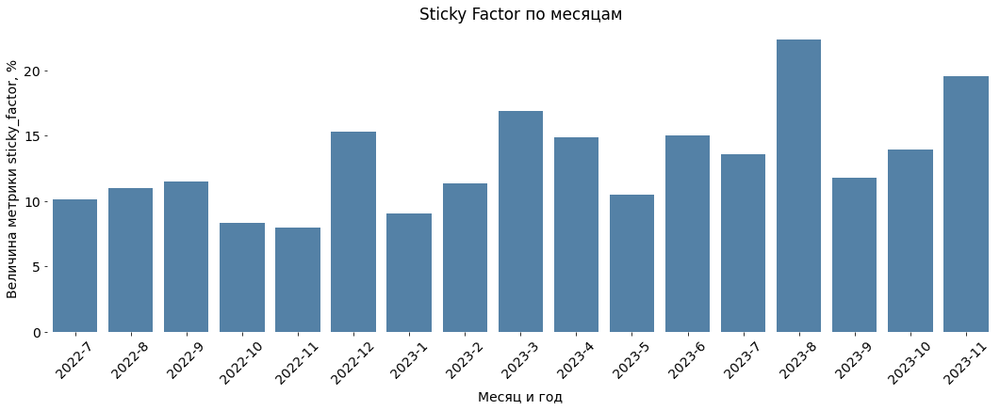

In [142]:
plt.figure(figsize=(18,6))
plt.rcParams.update({'font.size': 14})
ax = sns.barplot (x='date_my', y='sticky_factor', data = df_sticky, color='steelblue')
ax.set_title('Sticky Factor по месяцам')
ax.set_xlabel("Месяц и год")
ax.set_ylabel("Величина метрики sticky_factor, %")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.show()

По данному графику мы можем сделать вывод, что регулярность посещений колеблется. Мы не видим здесь какой-то четкой тенденции к снижению или повышению. Если сравнивать 2022 год и 2023 год, то данная метрика в среднем по месяцам стала выше, т.е. пользователи стали чаще заходить на сайт.

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> 
    
На самом деле sticky factor довольно противоречивая метрика Скажем так, чтобы для тщеславныъ продакт аналитиков Как правило при анализе ей мало оперируют
</div>

## RFM-анализ

RFM-анализ — метод анализа, позволяющий сегментировать клиентов по частоте и сумме покупок и выявлять тех, которые приносят больше денег.

In [143]:
df_paid.head()

,paid_id,datetime_fa,channel_fa_id,name_channel_fa,total_price,product_name,price_line,status_id,user_id,datetime_fa_dt
0,37117,2021-10-14,1,Административный сайт Mindbox,1,На уставную деятельность,1,Paid,2734,2021-10-14 15:50:00
1,58434,2021-03-18,1,Административный сайт Mindbox,50,На уставную деятельность,50,Paid,2734,2021-03-18 10:52:00
3,111808,2023-03-29,9,Сайт,300,Пожертвование - Ратмир Шаповалов,300,Paid,2847,2023-03-29 15:15:00
4,67535,2021-06-16,1,Административный сайт Mindbox,200,На уставную деятельность,200,Paid,2847,2021-06-16 23:10:00
5,72610,2021-09-20,1,Административный сайт Mindbox,25,На уставную деятельность,25,Paid,2861,2021-09-20 14:29:00


In [144]:
df_paid.datetime_fa = pd.to_datetime(df_paid.datetime_fa, dayfirst=True).dt.date

Выполним расчет периода активности каждого пользователя в днях.

In [145]:
df_paid['period'] = (
    df_paid.groupby('user_id')['datetime_fa']
    .transform(lambda cell: int((cell.max() - cell.min()) / pd.Timedelta('1d')) + 1)
)

За дату анализа примем максимальную дату в датасете плюс один день. 

In [146]:
now = df_paid.datetime_fa.max() + pd.Timedelta('1d')

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> 
    
Здорово </div>

**Посчитаем данные для расчета рангов R, F, M**

**Recency — давность** (как давно пользователь делал последний платеж). Высокий показатель давности означает, что у пользователя уже сложилось достаточно хорошее впечатление о благотворительном фонде, поэтому он недавно в очередной раз сделал пожертвование. Давность в срезе пользовательской базы можно посмотреть, если отсортировать клиентов по дате последней покупки.

In [147]:
# разница между максимальной датой в датасете и текущей датой платежа пользователя
df_paid['R_current'] = df_paid.datetime_fa.apply(lambda cell: int(((now - cell) / pd.Timedelta('1d'))))

In [148]:
# Определение R-value
df_paid['R_value'] = df_paid.groupby('user_id')['R_current'].transform('min')

**Frequency — частота** (как часто пользователи делают пожертвования). Высокий показатель частоты говорит о том, что пользователь доверяет бренду. Для расчета частоты пожертвований нужно общее количество переводов разделить на период активности пользователя в днях.

In [149]:
df_paid['F_value'] = df_paid.groupby('user_id')['user_id'].transform('count') / df_paid.period

**Monetary — деньги** (общая сумма трат)

In [150]:
df_paid['M_value'] = df_paid.groupby('user_id')['price_line'].transform('sum')

In [151]:
pd.options.plotting.backend = 'plotly'
sns.set_style('whitegrid')

In [152]:
fig = df_paid.R_value.plot(kind='box',
                    notched=True,
                    orientation='h',
                    labels={'variable':'Параметр', 'value': 'Значение параметра'})

fig.update_layout(title_text='Распределение R-value', title_x=0.5)
fig.show()

Значения для расчета давности делим на три равных интервала.

In [153]:
pd.qcut(df_paid.R_value, 3).unique()

[(348.0, 1074.0], (73.0, 348.0], (0.999, 73.0]]
Categories (3, interval[float64, right]): [(0.999, 73.0] < (73.0, 348.0] < (348.0, 1074.0]]

Формируем три интервала на основе полученных. Присваиваем ранги по параметру Recency: чем больше времени прошло с момента последнего пожертвования, тем ниже ранг по этому параметру у пользователя, чем давность меньше, тем выше ранг.

In [154]:
r_bins = [0.999, 74, 349, df_paid.R_value.max()]
r_labels = [3, 2, 1]

In [155]:
# выполним сегментацию пользователей по параметру R, сохраним результаты в отдельном столбце
df_paid['R'] = pd.cut(df_paid.R_value, bins=r_bins, labels=r_labels)

In [156]:
fig = df_paid.F_value.plot(kind='box',
                  notched=True,
                  orientation='h',
                  title='Распределение F-value',
                  labels={'variable':'Параметр', 'value': 'Значение параметра'})

fig.update_layout(title_text='Распределение F-value', title_x=0.5)
fig.show()

На графике видно наличие выбросов. Нехарактерными значениями можно считать те, что отклоняются от третьего квартиля вверх больше чем на полтора межквартильных размаха, поэтому для очистки частоты заходов от выбросов используем межквартильный размах.

In [157]:
# q1, q3 - это 25 и 75 перцентили
qf_1, qf_3 = np.percentile(df_paid.F_value, [25, 75])

In [158]:
# считаем интерквартильный размах - разницу между 75 и 25 перцентилями
int_span_f = qf_3 - qf_1

In [159]:
# устанавливаем верхнюю границу для выбросов: 3-й квартиль + полтора интерквартильных размаха
f_top = qf_3 + int_span_f * 1.5

In [160]:
# смотрим на графике, что получилось
fig = df_paid.query('F_value <= @f_top').F_value.plot(kind='box',
                                            notched=True,
                                            orientation='h',
                                            labels={'variable':'Параметр', 'value': 'Значение параметра'})
fig.update_layout(title_text='Распределение F-value', title_x=0.5)
fig.show()

In [161]:
# чтобы получить равномерные интервалы среди характерных значений, разбиваем на категории без учета выбросов
pd.qcut(df_paid.query('F_value <= @f_top').F_value, 3).unique()

[(0.001, 0.0259], (0.0913, 2.0], (0.0259, 0.0913]]
Categories (3, interval[float64, right]): [(0.001, 0.0259] < (0.0259, 0.0913] < (0.0913, 2.0]]

In [162]:
# возвращаем в данные то, что отбросили, определив верхнюю границу, равной максимуму по столбцу
f_bins = [0.001, .026, .0914, df_paid.F_value.max()]
f_labels = [1, 2, 3]

In [163]:
# выполним сегментацию пользователей по параметру F, сохраним результаты в отдельном столбце
df_paid['F'] = pd.cut(df_paid.F_value, bins=f_bins, labels=f_labels)

In [164]:
fig = df_paid.M_value.plot(kind='box',
                  notched=True,
                  orientation='h',
                  labels={'variable':'Параметр', 'value': 'Значение параметра'})
fig.update_layout(title_text='Распределение M-value', title_x=0.5)
fig.show()

На графике видим, что данные по доходности также имеют выбросы. Как и в предыдущем случае, делаем очистку через интерквартильный размах.

In [165]:
# считаем 25 и 75 перцентили
qm_1, qm_3 = np.percentile(df_paid.M_value, [25, 75])

In [166]:
# считаем межквартильный размах
int_span_m = qm_3 - qm_1

In [167]:
# считаем верхнюю границу для выбросов: 3-й квартиль + полтора интерквартильных размаха
m_top = qm_3 + int_span_m * 1.5

In [168]:
fig = df_paid.query('M_value <= @m_top').M_value.plot(kind='box',
                                            notched=True,
                                            orientation='h',
                                            title='Распределение M-value',
                                            labels={'variable':'Параметр', 'value': 'Значение параметра'})
fig.update_layout(title_text='Распределение M-value', title_x=0.5)
fig.show()

In [169]:
pd.qcut(df_paid.query('M_value <= @m_top').M_value, 3).unique()

[(0.999, 600.0], (2800.0, 14200.0], (600.0, 2800.0]]
Categories (3, interval[float64, right]): [(0.999, 600.0] < (600.0, 2800.0] < (2800.0, 14200.0]]

In [170]:
m_bins = [0.999, 601, 2801, df_paid.M_value.max()]
m_labels = [1, 2, 3]

In [171]:
# сегментируем по доходности и добавляем столбец
df_paid['M'] = pd.cut(df_paid.M_value, bins=m_bins, labels=m_labels)

Добавляем столбец с сегментами RFM

In [172]:
df_paid['RFM'] = df_paid.R.astype('str') + df_paid.F.astype('str') + df_paid.M.astype('str')

In [173]:
df_rfm = df_paid[['user_id', 'RFM']].copy() 

In [174]:
df_rfm_final = df_rfm.groupby(['user_id'])['RFM'].first().reset_index()

In [175]:
df_rfm_final.head()

,user_id,RFM
0,2734,111
1,2847,211
2,2861,111
3,3361,133
4,4982,211


Мы получили таблицу с идентификаторами пользователя и сегментом. 

Метрики расчитывались следующим образом: 
- 1 - плохо, 
- 2 - терпимо, 
- 3 - хорошо

**Значения метрик для показателей RFM**

R (recency): 
- 1 - давний - делал платеж давно (больше 348 дней), 
- 2 - спящий - не делал переводов от 73 до 348 дней, 
- 3 - недавний - недавно делал платеж (не более 73 дней назад)

F (frequency): 
- 1 - разовый - делает пожертвования не часто (от 0,001 до 0,026 раз в день, или не чаще одного раза в 38 дней), 
- 2 - редкий - средняя активность (от 0,027 до 0,0913 пожертвований в день, или одно пожертвование в интервале от 11 до 38 дней), 
- 3 - частый - высокая активность (переводит деньги не реже 1 раза каждые 11 дней)

M (monetary): 
- 1 - низкая сумма - сделал пожертвований до 600 рублей за все время, 
- 2 - средняя сумма - пожертвований от 600 до 2800 рублей за все время, 
- 3 - высокая сумма - самые щедрые пользователи, более 2800 рублей за все время

Мы получили всего 27 сегментов пользователей с оценками вида: 111, 112, ..., 333.

| <!--    -->      | <!--    -->        | <!--    -->      |
|:-------------:|:---------------:|:-------------:|
| 333 - недавние частые с большой суммой | 233 - спящие частые с большой суммой | 133 - давние частые с большой суммой |
| 332 - недавние частые со средней суммой | 232 - спящие частые со средней суммой | 132 - давние частые со средней суммой |
| 331 - недавние частые с маленькой суммой | 231 - спящие частые с маленькой суммой | 131 - давние частые с маленькой суммой |
| 323 - недавние редкие с большой суммой | 223 - спящие редкие с большой суммой | 123 - давние редкие с большой суммой |
| 322 - недавние редкие со средней суммой | 222 - спящие редкие со средней суммой | 122 - давние редкие со средней суммой|
| 321 - недавние редкие с маленькой суммой | 221 - спящие редкие с маленькой суммой | 121 - давние редкие с маленькой суммой |
| 313 - недавние разовые с большой суммой | 213 - спящие разовые с большой суммой | 113 - давние разовые с большой суммой |
| 312 - недавние разовые со средней суммой | 212 - спящие разовые со средней суммой | 112 - давние разовые со средней суммой |
| 311 - недавние разовые с маленькой суммой | 211 - спящие разовые с маленькой суммой | 111 -давние разовые с маленькой суммой |

In [176]:
df_paid['RFM'].unique()

array(['111', '211', '133', '131', '132', '213', '112', '311', '113',
       '313', '212', '122', '123', '121', '323', '231', '222', '312',
       '233', '232', '223', '322', '221', '332', '333', '321', '331'],
      dtype=object)

**Статистика по сегментам**

In [177]:
def median(dp):
    median = statistics.median(dp)
    return median

rfm_stats = (
    df_paid.groupby('RFM').agg({'user_id':'nunique', 'price_line': ['count', 'mean', 'median', 'sum']}).reset_index()
)

In [178]:
rfm_stats.head()

RFM user_id price_line                         
       nunique      count    mean  median      sum
0  111     254        599  154.17  100.00    92345
1  112     302       1027  398.32  300.00   409078
2  113     114        599 2161.13 1000.00  1294518
3  121     137        491   97.14  100.00    47696
4  122     201       1319  215.45  100.00   284176

In [179]:
rfm_stats.columns = ['RFM сегмент', 'Человек в сегменте, чел.', \
                     'Количество пожертвований, ед.', 'Среднее пожертвование, руб.', 'Медиана пожертвований, руб.', \
                     'Сумма пожертвований, руб.']

In [180]:
rfm_stats.set_index('RFM сегмент').style.format(thousands='.', decimal=',', precision=2).bar(color='LightSkyBlue')

,"Человек в сегменте, чел.","Количество пожертвований, ед.","Среднее пожертвование, руб.","Медиана пожертвований, руб.","Сумма пожертвований, руб."
RFM сегмент,,,,,
111,254,599,"154,17","100,00",92.345
112,302,1.027,"398,32","300,00",409.078
113,114,599,"2.161,13","1.000,00",1.294.518
121,137,491,"97,14","100,00",47.696
122,201,1.319,"215,45","100,00",284.176
123,163,1.915,"1.029,91","500,00",1.972.270
131,5.024,5.241,"288,80","300,00",1.513.581
132,1.270,1.577,"967,35","1.000,00",1.525.508
133,403,796,"4.722,47","2.625,00",3.759.090


**График распределения пользователей по сегментам**

In [181]:
rfm_stats = rfm_stats.sort_values(['Человек в сегменте, чел.'], ascending=False)

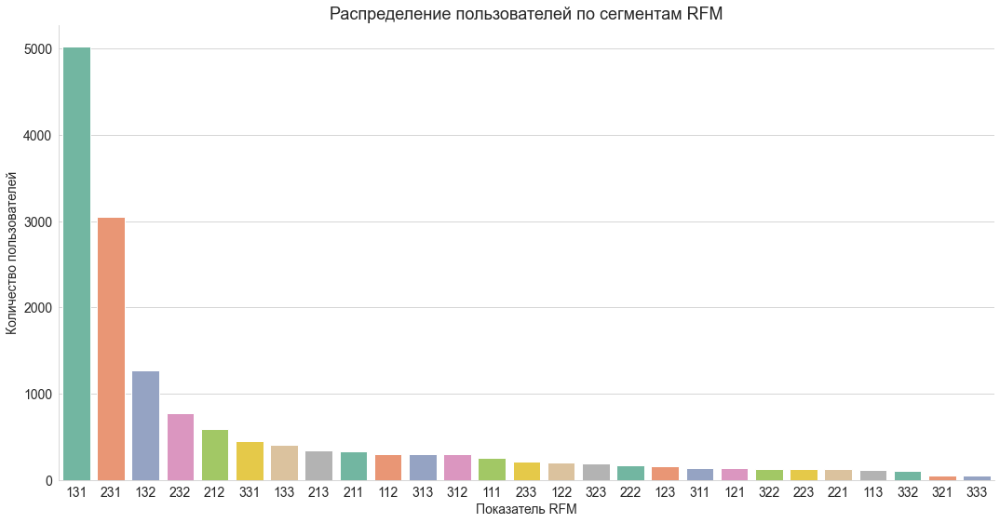

In [182]:
plt.figure(figsize=(18, 9))
ax = sns.barplot(x="RFM сегмент", y="Человек в сегменте, чел.", data=rfm_stats,  palette ='Set2');
ax.set_title('Распределение пользователей по сегментам RFM', size=18)
ax.set_xlabel('Показатель RFM', size=14) 
ax.set_ylabel('Количество пользователей', size=14)
sns.despine()

Два самых больших сегмента - 131 и 231.
- 131 - это люди, которые уже давно делали последний платеж, но раньше они платили часто, хоть и небольшими суммами (средний платеж - 288,8 руб.). Возможно, это потерянные жертвователи, их много, больше 5000 чел. Нужно проработать меры по возврату таких пользователей.
- 231 - это сегмент, похожий на предыдущий, с той разницей, что время с момента последнего платежа прошло меньше. Средняя сумма пожертвований в таком сегменте - 309,9 руб. Шанс вернуть этих пользователей чуть выше. Возможно, стоит им напомнить о фонде, сделав email-рассылку.


В аутсайдерах сегменты 333 и 321:
- 333 - самые лояльные пользователи, которые часто делают платежи, большими суммами (средний перевод - 928 руб.). Всего в сегменте 47 человек. Нужно принимать меры по наращиванию.
- 321 - активные сейчас посетители, которые изредка делают небольшие переводы (средний платеж - 59,75 руб.)

Стоит также обратить внимание на сегменты:
- 133 и 233, которые выделяются изо всех высокими размерами медианных платежей (2625 руб. и 3000 руб., соответственно). В сегменте 133 - 403 человека. Это люди, делавшие часто крупные переводы, но теперь переставшие их совершать совсем. В сегменте 233 - 210 человек. Он тоже состоит из щедрых жертвователей, разница лишь в том, что это не совсем давние посетители. 
- 323 - в сегменте 197 человек, которые в общей сложности сделали 4848 платежей, что составляет в среднем по 25 платежей на человека. Этот сегмент считается сегментом недавних редких плательщиков. Т.к. частота (показатель F в анализе) рассчитывается, как отношение количества платежей к количеству дней на сайте, и количество платежей в этом сегменте высокое, то можно сделать вывод, что люди, входящие в сегмент 323 зарегестрированы давно (много дней). Для фонда это надежный сегмент, который стоит поддерживать и увеличивать. Возможно, стоит изучить его получше и, есть вероятность, что обнаружатся какие-то действия, которые стимулируют людей из этого сегмента на совершение платежей и способствуют их долгому удержанию в числе жертвователей именно через фонд "АИФ. Доброе сердце".


<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> 
    
RFM без замечаний Все подробно, ясно и по делу Очень крутое исследование</div>

## Общий вывод

В данном проекте было проведено исследование по заказу Благотворительного фонда "АиФ. Доброе сердце". 
Цель: узнать лучше благотворителей для выстраивания более эффективной работы фонда.

В ходе проведения работы были определены основные статистические характеристики по платежам, выявлены основные цели пожертвований, проведен анализ каналов привлечения и определены источники первого входа, выполнен анализ динамики пожертвований, анализ активности по времени суток и по дням недели. Также был выполнен расчет основных продуктовых метрик (MAU, DAU, WAU и Sticky Factor). Проведен RFM-анализ. 

Исследовательский анализ показал, что чаще всего пользователи делают переходы на сайт из Email-рассылок, что говорит об их эффективности. Первым каналом входа, как правило, является сам сайт фонда. По переведенным суммам платежей и количеству переводов пока лидируют нецелевые пожертвования, но это, если рассматривать весь период, за который собраны данные. Тенденция явно поменялась. С мая 2022 года и по настоящее время пользователи стали гораздо охотнее переводить деньги на конкретные цели. 

Наибольшую активность по переводам пользователи совершают по вторникам и четвергам. Наименьшую - по выходным. Данный факт надо учесть при планировании email-рассылок. 
По времени пользователи менее активны ночью, более активны утром и днем до 13 часов включительно, потом активность платежей немного спадает. Но при проведении анализа было выявлено время - 00 часов, в которое фиксируется всплеск по платежам. Возможно, он связан с процессингом. 

Из рассчета продуктовой метрики MAU виден стабильный рост числа пользователей до августа 2023 года, в сентябре и октябре наблюдается снижение. Графики по метрикам WAU и DAU показывают, что есть сильные колебания: в некоторые дни и недели было резкое снижение активности. Возможно, в эти периоды не было рассылок. Стоит обратить внимание и проверить, что могло привести к снижению метрик в эти периоды.  

Sticky Factor ("липучесть"). При рассмотрении этой метрики был сделан вывод, что регулярность посещений колеблется. Мы не видим здесь какой-то четкой тенденции к снижению или повышению. Если сравнивать 2022 год и 2023 год, то данная метрика в среднем по месяцам стала выше, т.е. пользователи стали чаще заходить на сайт.

При проведении RFM-анализа все пользователи были поделены на 27 сегментов. Была составлена таблица с описанием каждого сегмента для удобства работы заказчика, а также подготовлена таблица в формате excel, содержащая идентификаторы всех пользователей и номера сегментов RFM.

RFM-анализ показал, что фонд собрал достаточно большую базу людей, которые хотя бы раз делали пожертвование, но на сегодняшний день большинство из них либо давно забыли, либо начали забывать о фонде и, соответственно, перестали делать платежи. Можно порекомендовать провести детальный анализ эффективности email-рассылок (как часто делаются, какой в них текст, какой эффект получаем в зависимости от содержания и частоты писем и т.д.). Возможно, стоит также рассмотреть новые способы по удержанию и "возврату" пользователей, например, рассылку sms-уведомлений, т.к. некоторые люди отдают им предпочтение. Также могло бы быть эффективным создание мобильного приложения.

**Ссылка на файл с результатом RFM-анализа:**

<https://disk.yandex.ru/i/0aR_MHxut0QQOw>

<div class="alert alert-block alert-success"> <b>Reviewer's comment</b> 
    
Блестящая работа и великолепный вывод</div>